In [31]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from pavone.process import process_all_pavone_data, baseline_correct, savgol_smoothing, calculate_timings, split_by_timings, process_data
from pavone.parse import read_pavone_data
from pavone.types import PavoneKey
from pavone.plot import plot_data_summary

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/pavone/process.py:113: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert (


In [54]:
pavone_data = process_all_pavone_data(
    # "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data/2024.04.11 and 04.13",
    # "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data/2024.04.11 also",
    "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data",
    "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data/processed",
)
processed_paths = pavone_data["output_filepath"].tolist()

Found 179 files of type 'txt' in '/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data'
Excluding files containing: ['position', 'test', 'Screening']
Filtered down to 107 files after exclusion
Found 107 Pavone files in /Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data


Found 179 files of type 'txt' in '/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data'
Excluding files containing: ['position', 'test', 'Screening']
Filtered down to 107 files after exclusion
Found 107 Pavone files in /Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data


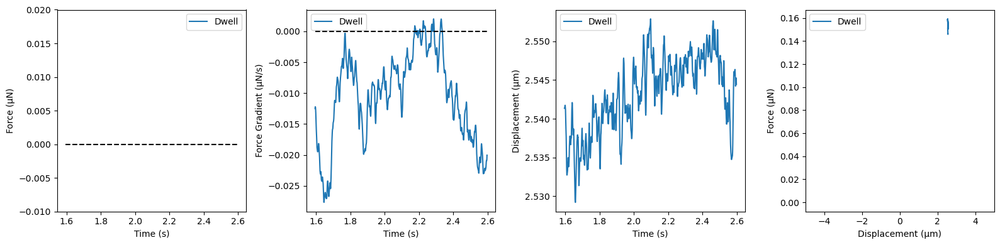

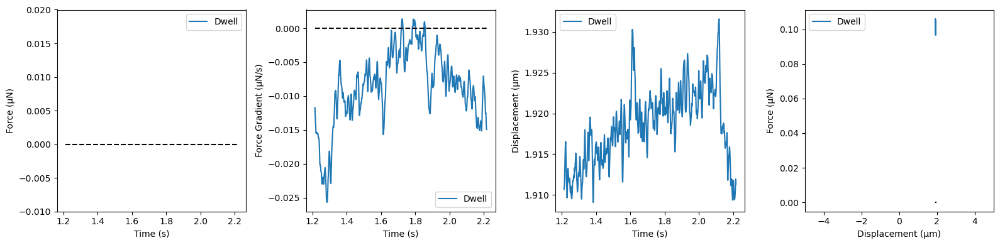

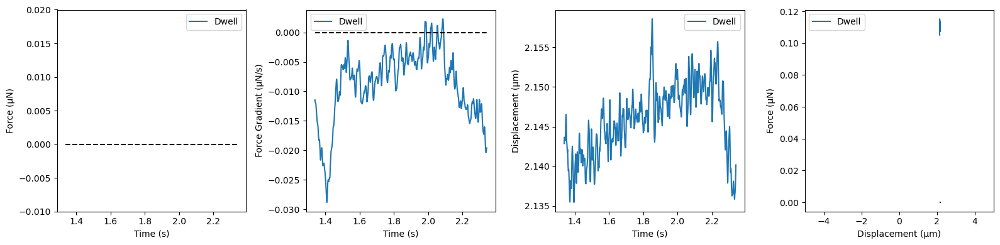

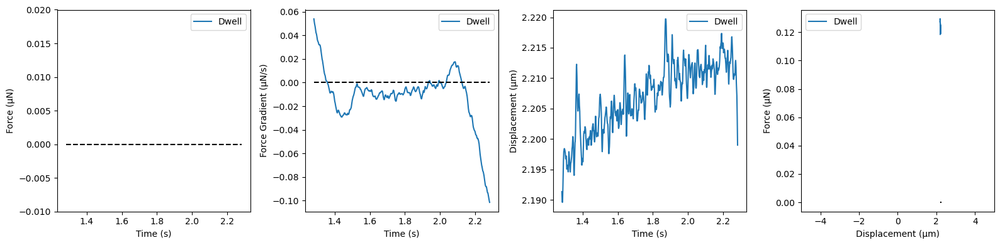

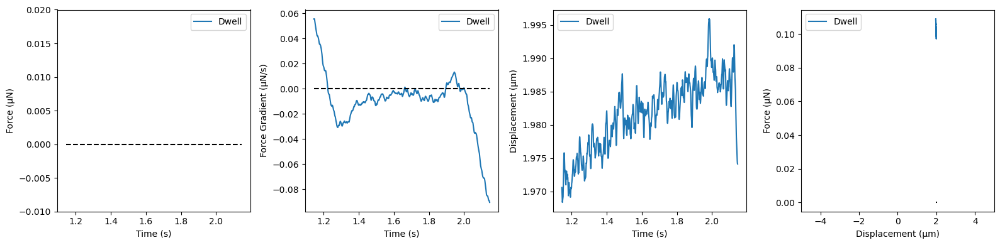

...

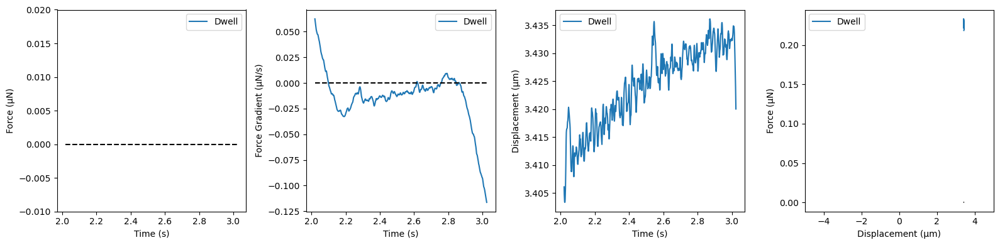

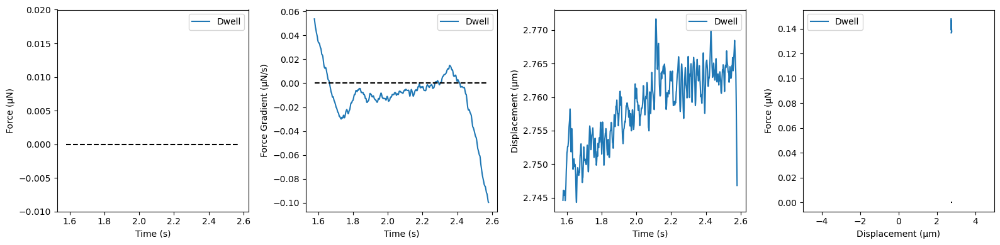

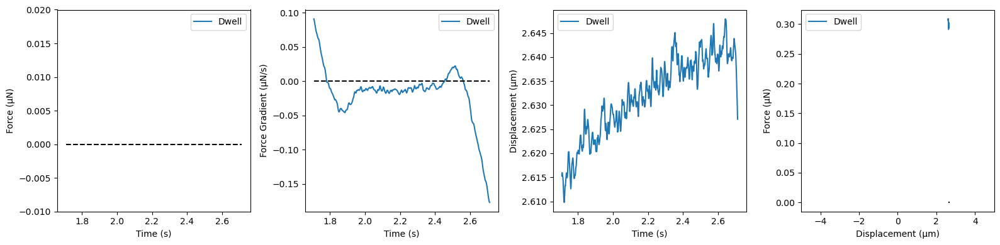

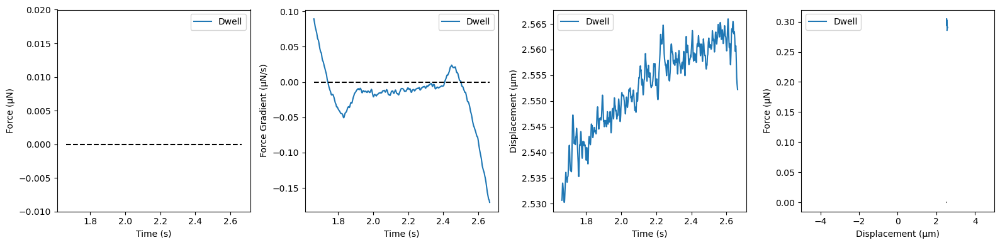

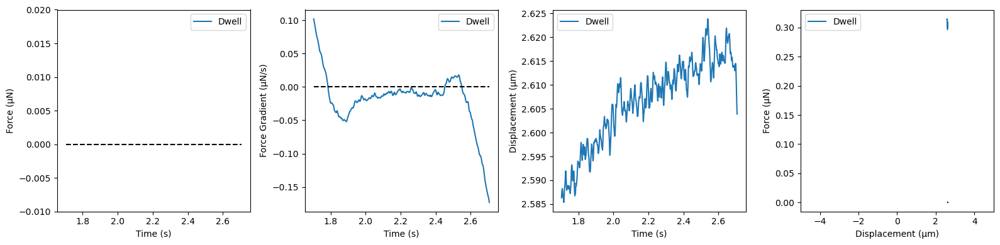

In [56]:
pavone_data = process_all_pavone_data(
    "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data",
    "/Users/devoncallan/Documents/GitHub/PavoneAnalyzer/test_data/processed",
)
processed_paths = pavone_data["output_filepath"].tolist()
for i, row in pavone_data.iterrows():
    path = row["output_filepath"]

    data = pd.read_csv(path)

    data, contact_point, pull_off_point = process_data(data, row)
    approach_data, dwell_data, retract_data = split_by_timings(data, row)

    # plot_data_summary(
    #     approach_data, dwell_data, retract_data, contact_point, pull_off_point
    # )
    plot_data_summary(dwell_data=dwell_data)
    # plot_data_summary(approach_data=approach_data)
    # plot_data_summary(retract_data=retract_data)

In [ ]:
from sklearn.linear_model import LinearRegression

for path in processed_paths:
    plt.figure(figsize=(4, 4))
    data = pd.read_csv(path)
    time = data[PavoneKey.time]
    force = data[PavoneKey.force]

    print(path)

    # Plot original data
    plt.plot(time, force, "-", alpha=0.7)

    # Fit baseline to first 2 seconds AND last 60 seconds
    first_mask = time <= time.min() + 2.0
    last_mask = time >= time.max() - 0.5
    baseline_mask = first_mask | last_mask

    baseline_time = time[baseline_mask].values.reshape(-1, 1)
    baseline_force = force[baseline_mask].values

    reg = LinearRegression()
    reg.fit(baseline_time, baseline_force)

    # Calculate residuals and standard deviation
    baseline_pred = reg.predict(baseline_time)
    residuals = baseline_force - baseline_pred
    std_dev = np.std(residuals)

    # Extend baseline across full time
    baseline_line = reg.coef_[0] * time + reg.intercept_

    # Baseline subtract the force data
    force_corrected = force - baseline_line

    # Plot corrected data
    plt.plot(time, force_corrected, "-", alpha=0.7)

    # Add 3-sigma confidence band (now centered at zero)
    std_dev = np.percentile(
        np.abs(residuals), 95
    )  # Use 95th percentile for confidence band
    upper_bound = 3 * std_dev
    lower_bound = -3 * std_dev
    # lower_bound = np.percentile(np.abs(residuals), 5)
    # upper_bound = np.percentile(np.abs(residuals), 95)
    plt.fill_between(time, lower_bound, upper_bound, alpha=0.2, color="red")
    plt.axhline(y=0, linestyle="--", color="red")
    # plt.xlim(100, 120)
    # plt.xlim(11, 12)
    plt.show()

In [ ]:
import numpy as np

plt.plot(np.diff(data[PavoneKey.displacement]), "-", alpha=1)

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy.signal import savgol_filter
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Savitzky-Golay parameters
window_length = 251  # Must be odd, adjust based on your data density
polyorder = 3  # Polynomial order (typically 2-4)

for path in processed_paths:
    plt.figure(figsize=(4, 4))
    data = pd.read_csv(path)
    time = data[PavoneKey.time]
    force = data[PavoneKey.force]
    print(path)

    # Plot original data
    # plt.plot(time, force, "-", alpha=0.1, label="Original")

    # Fit baseline to first 2 seconds AND last 0.5 seconds
    first_mask = time <= time.min() + 2.0
    last_mask = time >= time.max() - 0.5
    baseline_mask = first_mask | last_mask
    baseline_time = time[baseline_mask].values.reshape(-1, 1)
    baseline_force = force[baseline_mask].values

    reg = LinearRegression()
    reg.fit(baseline_time, baseline_force)

    # Calculate residuals and standard deviation
    baseline_pred = reg.predict(baseline_time)
    residuals = baseline_force - baseline_pred
    std_dev = np.std(residuals)

    # Extend baseline across full time
    baseline_line = reg.coef_[0] * time + reg.intercept_

    # Baseline subtract the force data
    force_corrected = force - baseline_line

    # Apply Savitzky-Golay smoothing to the corrected data
    # Check if we have enough points for the window
    if len(force_corrected) >= window_length:
        force_smoothed = savgol_filter(force_corrected, window_length, polyorder)
    else:
        # If not enough points, use a smaller window (must be odd and > polyorder)
        min_window = max(polyorder + 1, 5)
        if min_window % 2 == 0:
            min_window += 1
        if len(force_corrected) >= min_window:
            force_smoothed = savgol_filter(force_corrected, min_window, polyorder)
        else:
            # Too few points for meaningful smoothing
            force_smoothed = force_corrected.copy()
            print(f"Warning: Too few data points for smoothing in {path}")

    # Plot corrected and smoothed data
    # plt.plot(time, force_corrected, "-", alpha=0.1, label="Baseline Corrected")
    # plt.plot(
    #     time, force_smoothed, "-", alpha=0.5, linewidth=2, label="Smoothed (Savgol)"
    # )
    plt.plot(
        time,
        np.diff(force_corrected, prepend=0),
        "-",
        alpha=0.1,
        label="Baseline Corrected",
    )
    plt.plot(
        time,
        np.diff(force_smoothed, prepend=0),
        "-",
        alpha=0.5,
        linewidth=2,
        label="Smoothed (Savgol)",
    )

    # Add 3-sigma confidence band (now centered at zero)
    std_dev = np.percentile(
        np.abs(residuals), 95
    )  # Use 95th percentile for confidence band
    upper_bound = 3 * std_dev
    lower_bound = -3 * std_dev

    # plt.fill_between(
    #     time, lower_bound, upper_bound, alpha=0.2, color="red", label="Confidence Band"
    # )
    plt.axhline(y=0, linestyle="--", color="red", alpha=0.5)

    plt.legend()
    plt.xlabel("Time")
    plt.ylabel("Force (corrected)")
    plt.title(f"Savitzky-Golay Smoothing\nWindow: {window_length}, Order: {polyorder}")
    plt.tight_layout()
    plt.show()